# ***Coronavirus tweets - Text Classification / Sentiment Analysis***

[Kaggle Dataset](https://www.kaggle.com/datasets/datatattle/covid-19-nlp-text-classification/data)

This TP is relatively light coding-wise, please focus on the questions

⚠️Answers mindlessly copied from chatGPT will be penalized⚠️


For those running on a poetry environment, you will probably need to run:

```bash
!poetry add seaborn plotly sklearn xgboost
```

In [1]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import re
import numpy as np

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from xgboost import XGBClassifier

## ***Reading Data***

In [2]:
df = pd.read_csv("./data/Corona_NLP.csv", index_col=0)
print(df.shape)
df.head()

(44955, 6)


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative


## ***Data Exploration***

In [3]:
class_labels = ["Extremely Negative", "Negative", "Neutral", "Positive", "Extremely Positive"]
category_orders = {"Sentiment": class_labels}

# use the value_counts function on the Sentiment column to print the class distribution # https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html
# use px.histogram to visualize the distribution, you can include the above parameters # https://plotly.com/python/histograms/
 
# class distribution
print(df["Sentiment"].value_counts()) 

px.histogram(df, category_orders=category_orders, x="Sentiment", color="Sentiment")

Sentiment
Positive              12369
Negative              10958
Neutral                8332
Extremely Positive     7223
Extremely Negative     6073
Name: count, dtype: int64


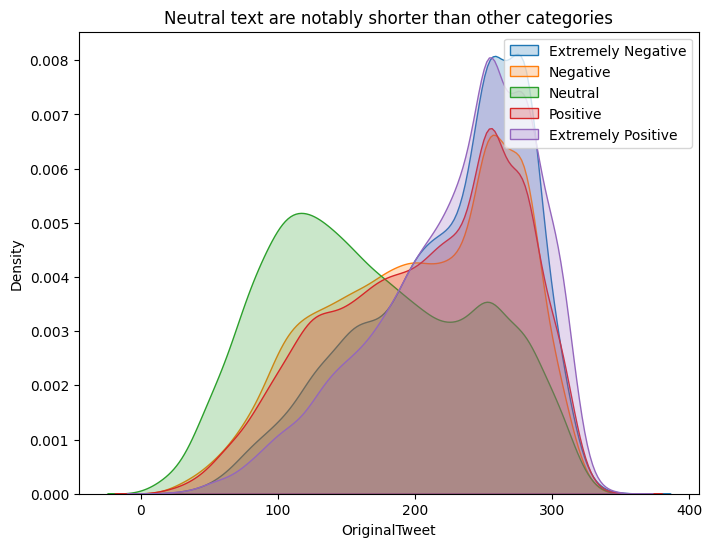

In [4]:
plt.figure(figsize=(8,6))

# use the sns.kdeplot function to visualize text length for each class # https://seaborn.pydata.org/generated/seaborn.kdeplot.html

for sentiment in class_labels:
    sns.kdeplot(df[df["Sentiment"] == sentiment]["OriginalTweet"].str.len(), label=sentiment, fill=True)
    
plt.legend()
plt.title("Neutral text are notably shorter than other categories")
plt.show()


What do you observe on this plot ? Could this be important in the future ?
*  Most of the tweets have the same lenth distribution, and the highest density is around 300. Only neutral tweets have a different distribution, with shorter tweets. This could be important in the future, because we could use this information to classify the tweets.***

* About the distribution of the tweet we can see that the positive classe is the most represented, followed by the negative and the neutral classe. Something we can see is that the total positive classe (positive and extremely positive) is more represented than the total negative classe (negative and extremely negative)

## ***Preprocessing***

Here's the preprocessing function we'll use today:

* Removing twitter handles and url
* Tokenizing the text
* Lowering and removing non alphanumeric characters
* Removing stopwords
* Lemmatizing

In [5]:
def remove_twitter_handles_url(text):
    twitter_handle_pattern = r'@[\w_]+'
    url_pattern = r'https?://\S+|www\.\S+'
    
    no_handle = re.sub(twitter_handle_pattern, '', text)
    cleaned_text = re.sub(url_pattern, '', no_handle)

    return cleaned_text

def preprocess_text(text):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))

    cleaned_text = remove_twitter_handles_url(text)
    # Tokenization
    tokens = word_tokenize(cleaned_text)
    # Remove punctuation and convert to lowercase
    words = [word.lower() for word in tokens if word.isalnum()] # isalnum() checks if all characters in a string are alphanumeric
    # Remove stopwords
    words = [word for word in words if word not in stop_words]
    # Lemmatization using WordNetLemmatizer
    words = [lemmatizer.lemmatize(word) for word in words]
    
    return ' '.join(words)

## ***Feature extraction***

Let's apply the Bag of Words encoding to some processed text and visualize the output vector

In [6]:
processed = df["OriginalTweet"].head(200).apply(preprocess_text)
processed

0                                                       
1      advice talk neighbour family exchange phone nu...
2      coronavirus australia woolworth give elderly d...
3      food stock one empty please panic enough food ...
4      ready go supermarket covid19 outbreak paranoid...
                             ...                        
195    kept hearing boomer gon na travel cheap flight...
196    gt announces 10m loan fund administered provid...
197    pasta pasta sauce pizza sold grocery store eve...
198    panic fear fear mind killer pres working priva...
199    retail store closed end march keep staff custo...
Name: OriginalTweet, Length: 200, dtype: object

In [7]:
# instantiate count vectorizer # https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html
bag_of_words = CountVectorizer()
# fit and transform (at once) the preprocessed text (look through the documentation for the appropriate class method)
processed_vectors = bag_of_words.fit_transform(processed)
processed_vectors
"""<200x1561 sparse matrix of type '<class 'numpy.int64'>'
	with 3410 stored elements in Compressed Sparse Row format>"""

"<200x1561 sparse matrix of type '<class 'numpy.int64'>'\n\twith 3410 stored elements in Compressed Sparse Row format>"

What do the dimensions of the Bag of Words vectors correspond to ?
* Dimension 1: number of documents
* Dimension 2: number of words 

In [8]:
# convert the processed vectors to arrays (look at the "examples" section in the docs) and create a dataframe based on those vectors
bag_of_words_df = pd.DataFrame(processed_vectors.toarray()) # to array sparse matrix -> dense matrix
bag_of_words_df

,0,1,2,3,4,5,6,7,8,9,...,1551,1552,1553,1554,1555,1556,1557,1558,1559,1560
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
196,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
197,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
198,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
color_continuous_scale='RdBu_r'

# use the px.imshow plotly function to visualize your dataframe, use the above colorscale 
# https://plotly.com/python/imshow/ 

px.imshow(bag_of_words_df, color_continuous_scale='RdBu_r', title="Representation of [200 x 1561] Bag of Words encodings")

Looking at the vectorized text:
* Is the term "sparse representation" justified ?
    * even if some lines are drawinf (commun words), most of the vector is empty and the representation is sparse *
* Does this look efficient ?
   *  No, we have a lot of 0 in the vector, and we are loosing the order of the words in the sentence *

In [10]:
# repeat with a TDIDF vectorizer 
tfidf = TfidfVectorizer()
#fit and transform, same code as previously
processed_vectors = tfidf.fit_transform(processed)
processed_vectors

<200x1561 sparse matrix of type '<class 'numpy.float64'>'
	with 3410 stored elements in Compressed Sparse Row format>

In [11]:
tfidf_df = pd.DataFrame(processed_vectors.toarray())  # create a dataframe of vectors as previously 
tfidf_df

,0,1,2,3,4,5,6,7,8,9,...,1551,1552,1553,1554,1555,1556,1557,1558,1559,1560
0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
196,0.0,0.0,0.0,0.235625,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
# use imshow to plot the vector representations
px.imshow(tfidf_df, color_continuous_scale='RdBu_r', title="Representation of [200 x 1561] TF-IDF encodings")

## ***Label encoding and train/test split***

Now that we've vectorized the text, we want to encode the class labels and create a train/test split

In [13]:
label_encoder = LabelEncoder()  # instantiate a label encoder # https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html
# fit and transform the encoder on labels
df['Sentiment_enc'] = label_encoder.fit_transform(df['Sentiment']) 

In [14]:
# Split the data into training and testing sets
X = df["OriginalTweet"] 
y = df["Sentiment_enc"] 

test_size=0.2 
random_state=42

# use the train_test_split function with the above test size and random seed
X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size=test_size, random_state=random_state)# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html#sklearn.model_selection.train_test_split

## ***Model Definition***

Now we'll define a pipeline. This pipeline will take raw tweets as input, preprocess and vectorize them, before fitting a classification model to it.
Use the [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html#sklearn.pipeline.Pipeline) to instantiate your pipeline:
* Step 1: [Count vectorizer](https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html), ***using our preprocessing function as preprocessor***
* Step 2: A classification model, here a [Multinomial Naive Bayes](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html#sklearn.naive_bayes.MultinomialNB)

In [15]:
text_clf = Pipeline([
    ('count', CountVectorizer()),
    ('clf', MultinomialNB()),
])

## ***Training***

In [16]:
# fit the pipeline to the training data 
text_clf.fit(X_train, y_train)

Pipeline(steps=[('count', CountVectorizer()), ('clf', MultinomialNB())])

## ***Prediction***

In [17]:
y_pred = text_clf.predict(X_test)

## ***Results visualization***

In [18]:
# styling the confusion matrix
confusion_matrix_kwargs = dict(
    text_auto=True, 
    title="Confusion Matrix", width=1000, height=800,
    labels=dict(x="Predicted", y="True Label"),
    x=class_labels,
    y=class_labels,
    color_continuous_scale='Blues'
)

def report(y_true, y_pred, class_labels):
    print(classification_report(y_true, y_pred, target_names=class_labels))
    # print a classification report of the predictions # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.classification_report.html#sklearn-metrics-classification-report
    # create a confusion matrix and pass it to imshow to visualize it # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html#sklearn.metrics.confusion_matrix
    # (the confusion_matrix_kwargs are here for styling only)
    c_m = confusion_matrix(y_true, y_pred)
    fig = px.imshow(
        c_m,
        **confusion_matrix_kwargs
        )
    fig.show()

In [19]:
class_labels = label_encoder.inverse_transform(range(5))
# call the report function to visualize the classification results, use the above class_labels

report(y_test, y_pred, class_labels)

                    precision    recall  f1-score   support

Extremely Negative       0.71      0.24      0.36      1189
Extremely Positive       0.66      0.30      0.41      1457
          Negative       0.42      0.56      0.48      2204
           Neutral       0.76      0.27      0.40      1681
          Positive       0.39      0.70      0.50      2460

          accuracy                           0.46      8991
         macro avg       0.59      0.42      0.43      8991
      weighted avg       0.55      0.46      0.45      8991



## ***What happened here ?***
Looking at the confusion matrix:

* What are some examples of classes that are confused with one another ?
    * for example the classe Positive is confused with several ones, in particulary with extremely positive of course but also with negative, its not the case with extremely posituve and negative with 74 false positive (extremly positive pov)
* The "Neutral" class has 68% precision and 34% recall, what does this mean ?
  *  68% of the tweets predicted as neutral are actually neutral, and the recall mean that 34% of the neutral tweets are predicted as neutral

## ***Let's try with TD-IDF***

But first, let's define a [class](https://www.w3schools.com/python/python_classes.asp) that will make iterating through different architectures and vectorizers a lot faster

In [44]:
class Model:
    def __init__(self, X, y, model_architecture, vectorizer, random_seed=42, test_size=0.2) -> None:
        self.X = X
        self.y = y
        self.model_instance = model_architecture
        self.vectorizer = vectorizer
        self.random_seed = random_seed
        self.test_size = test_size

        self.pipeline = Pipeline([ 
            ('vectorizer', self.vectorizer),
            ('model', self.model_instance)
        ])# the pipeline as defined previously

        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=self.test_size, random_state=self.random_seed)
        # train test split using the above X, y, test_size and random_state

    def preprocess(self, text):
        def remove_twitter_handles_url(text):
            twitter_handle_pattern = r'@[\w_]+'
            url_pattern = r'https?://\S+|www\.\S+'
            
            no_handle = re.sub(twitter_handle_pattern, '', text)
            cleaned_text = re.sub(url_pattern, '', no_handle)

            return cleaned_text
        
        lemmatizer = WordNetLemmatizer()
        stop_words = set(stopwords.words('english'))
        cleaned_text = remove_twitter_handles_url(text)
        tokens = word_tokenize(cleaned_text)
        words = [word.lower() for word in tokens if word.isalnum()]
        words = [word for word in words if word not in stop_words]
        words = [lemmatizer.lemmatize(word) for word in words]
        
        return ' '.join(words)
    
    def fit(self):
        # fit self.pipeline to the training data
        self.pipeline.fit(self.X_train, self.y_train)

    def predict(self):
        return self.pipeline.predict(self.X_test)

    
    def predict_proba(self):
        return self.pipeline.predict_proba(self.X_test)
    
    def report(self, y_true, y_pred, class_labels):
        # the report function as defined previously
        print(classification_report(y_true, y_pred, target_names=class_labels))
        c_m = confusion_matrix(y_true, y_pred)
        fig = px.imshow(
            c_m,
            **confusion_matrix_kwargs
            )
        fig.show()
    def small_report(self, y_true, y_pred, class_labels):
        print(classification_report(y_true, y_pred, target_names=class_labels))
         

In [21]:
# instantiate the Model class with text and labels (X and y), a multinomial naive bayes model and a tfidf vectorizer
# fit the model
# predict and generate classification report

class_labels=label_encoder.inverse_transform(range(5))
 
model = Model(X, y, MultinomialNB(), TfidfVectorizer())
model.fit()
y_pred = model.predict()
model.report(y_test, y_pred, class_labels)
 

                    precision    recall  f1-score   support

Extremely Negative       1.00      0.01      0.02      1189
Extremely Positive       1.00      0.01      0.02      1457
          Negative       0.42      0.40      0.41      2204
           Neutral       0.85      0.04      0.08      1681
          Positive       0.34      0.92      0.49      2460

          accuracy                           0.36      8991
         macro avg       0.72      0.28      0.20      8991
      weighted avg       0.65      0.36      0.25      8991



* What is the model's behaviour ?
    * The model is taking everything for positive, it's not a good model. We can clearly see that the diagonal is very clear.
* Is this a sign of overfitting, underfitting ?
    * The model is only consifering 2 classes, so it's undefitting, not capable of learning the other classes
* Why could the model be biased towards the positive and negative classes ?
    * If the model is not well ballenced, like in this case with more positive class, the model will be biased.
* Naive Bayes assumes that features (words) are conditionally independent given the class label. Between the two encodings we've tried, which one seems to better satisfy this assumption ? 
    * The model with the count vectorizer, because the TD-IDF is taking into account the frequency of the words, so it's not independent of the class label.




In [22]:
# instantiate the Model class with text and labels (X and y), a logistic regression model and a tfidf vectorizer
# fit the model
# predict and generate classification report 
model = Model(X, y, LogisticRegression(), TfidfVectorizer())
model.fit()
y_pred = model.predict()
model.report(y_test, y_pred, class_labels)
 


/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



                    precision    recall  f1-score   support

Extremely Negative       0.60      0.49      0.54      1189
Extremely Positive       0.71      0.54      0.61      1457
          Negative       0.52      0.53      0.52      2204
           Neutral       0.66      0.67      0.66      1681
          Positive       0.52      0.63      0.57      2460

          accuracy                           0.58      8991
         macro avg       0.60      0.57      0.58      8991
      weighted avg       0.59      0.58      0.58      8991



## ***Results analysis***

Looking at the confusion matrix and the classification report:
* What has improved compared to Naive Bayes ?
    * ***Your** thoughts here*
* Are the confused classes still the same ? Why ?
    * ***Your** thoughts here*
* Are there mistakes that are more understandable/acceptable than others ?
    * ***Your** thoughts here*
* Given the confused classes, what could be done to make the task easier ?
    * ***Your** thoughts here*

## ***Investigate wrong predictions***

Let's take a look at the errors:

In [23]:
test_data = pd.concat((X_test, y_test), axis=1)
test_data["pred"] = y_pred
# using np.where, create a variable equal to one when the encoded sentiment and model prediction match
# https://numpy.org/doc/stable/reference/generated/numpy.where.html
test_data["correct_prediction"] = np.where(test_data["Sentiment_enc"] == test_data["pred"], 1, 0)
test_data

,OriginalTweet,Sentiment_enc,pred,correct_prediction
33054,https://t.co/2yMUPatIYU Wear a mask! Especiall...,1,1,1
33564,"In light of Covid-19, Canada's insurers are re...",4,4,1
32707,@ate_ted @SenTedCruz Supply &amp; Demand. COVI...,4,2,0
13252,Around 9 million people die of hunger and hung...,0,0,1
37837,Alarming but informative video everyone should...,1,1,1
...,...,...,...,...
21791,This #Quarantine really has done a number on m...,4,4,1
19570,Panic buying amidst concerns don t mix well wi...,2,2,1
11987,IÂve come in contact with more people while t...,3,4,0
738,Woman of 67 works in a grocery store in the US...,0,0,1


In [24]:
test_data["pred_label"] = test_data.pred.apply(lambda x: label_encoder.inverse_transform([x])[0])
px.histogram(test_data, x="pred_label", 
             color="correct_prediction", 
             category_orders=category_orders, 
             barmode="stack", 
            )

In [25]:
generator = test_data[test_data["correct_prediction"] == 0].head(20).iterrows()

## ***Execute the following cell a bunch of times to assess the quality of the model***

* Do you agree with the model predictions ? Do they make sense ? 
  * Give some examples
  * ***Your** thoughts here*

In [26]:
next_sample = next(generator)[1]

print(f"Tweet: {next_sample['OriginalTweet']}\n")
print(f"Processed Tweet: {preprocess_text(next_sample['OriginalTweet'])}\n")
print(f"True label: {label_encoder.inverse_transform([next_sample['Sentiment_enc']])}")
print(f"Prediction: {label_encoder.inverse_transform([next_sample['pred']])}")

Tweet: @ate_ted @SenTedCruz Supply &amp; Demand. COVID-19 is not going to impact demand indefinitely. Russia/Saudi will cut back production, but worldwide supply will have been decreased significantly. There goes your gas prices plus little things like tires cou

Processed Tweet: supply amp demand going impact demand indefinitely cut back production worldwide supply decreased significantly go gas price plus little thing like tire cou

True label: ['Positive']
Prediction: ['Negative']


In [27]:

probas = pd.DataFrame(model.predict_proba(), columns=class_labels)
probas.head()
#probas.columns = label_encoder.inverse_transform(probas.columns) # 
#probas.head()

,Extremely Negative,Extremely Positive,Negative,Neutral,Positive
0,0.011310,0.668479,0.039739,0.039733,0.240740
1,0.037885,0.111966,0.095169,0.061782,0.693197
2,0.142348,0.045087,0.470776,0.006269,0.335520
3,0.811567,0.001385,0.179333,0.003368,0.004347
4,0.016148,0.798327,0.038148,0.004659,0.142718


In [28]:
probas.describe()

,Extremely Negative,Extremely Positive,Negative,Neutral,Positive
count,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,0.137383,0.162092,0.239696,0.179697,0.281132
std,0.171257,0.192925,0.151675,0.179994,0.152728
min,0.000005,0.000013,0.000110,0.000005,0.000284
25%,0.030098,0.036643,0.122534,0.040040,0.165681
50%,0.068029,0.082621,0.217075,0.116910,0.265027
75%,0.168506,0.209444,0.335472,0.265614,0.384630
max,0.982287,0.991806,0.841986,0.927927,0.855602


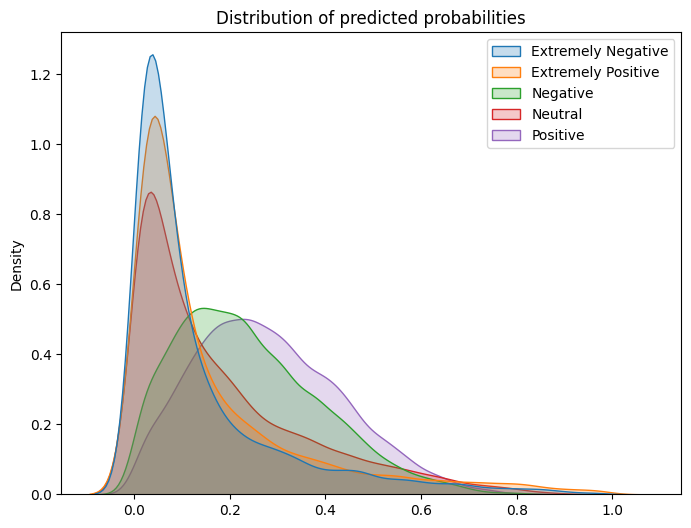

In [29]:
plt.figure(figsize=(8,6))
sns.kdeplot(data=probas, fill=True, )
plt.title("Distribution of predicted probabilities")
plt.show()

## ***Result analysis***

* What can you conclude from the above probability distribution ?
  - At the begining we have seen that the least represented classe is extremely negative, and we can see that the model and it's the class with the highest density of low probability, That's a good sign but it seems the its under represented, as well asneutral classe.Exept that the order of density in high probability is the same as the order of the number of tweets in the dataset. Thats a good sign exepte that the proportionality doesn't seem to be respected.
* Does the model appear confident in its predictions ?
  - Most of the probability are under 0.5, so the model is not confident in its predictions.
* How does it relate to the results obtained with the previous confusion matrices ?
  * ***Your** thoughts here*

## ***Solution 2: Change the class distribution***

In [30]:
{i: label_encoder.inverse_transform([i])[0] for i in range(5)}

{0: 'Extremely Negative',
 1: 'Extremely Positive',
 2: 'Negative',
 3: 'Neutral',
 4: 'Positive'}

In [31]:
new_mapping = {
    0:2, # extremely negative => negative
    1:4 # extremely positive => positive
}

In [32]:
df_reduced_labels = df.copy()
# replace the original sentiment encoding using the new mapping 
df_reduced_labels["Sentiment_enc"] = df_reduced_labels["Sentiment_enc"].replace(new_mapping)
category_orders = {"Sentiment_enc": ["Negative", "Neutral", "Positive"]}

print(round(df_reduced_labels.Sentiment_enc.value_counts(normalize=True)*100))
fig = px.histogram(df_reduced_labels, x="Sentiment_enc", 
             color="Sentiment_enc", 
             category_orders=category_orders, 
             title="Updated sentiment distribution",
             text_auto=True,
            )

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [2,3,4],
        ticktext = ["Negative", "Neutral", "Positive"]
    )
)
fig.show()

Sentiment_enc
4    44.0
2    38.0
3    19.0
Name: proportion, dtype: float64


In [33]:
X_reduced = df_reduced_labels['OriginalTweet']
print(X_reduced.head())
y_reduced = df_reduced_labels['Sentiment_enc']

y_test_reduced = y_test.replace(new_mapping)

0    @MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...
1    advice Talk to your neighbours family to excha...
2    Coronavirus Australia: Woolworths to give elde...
3    My food stock is not the only one which is emp...
4    Me, ready to go at supermarket during the #COV...
Name: OriginalTweet, dtype: object


In [34]:
print("Unique classes in y_test:", np.unique(y_test))
print("Unique classes in y_pred:", np.unique(y_pred))

Unique classes in y_test: [0 1 2 3 4]
Unique classes in y_pred: [0 1 2 3 4]


In [35]:
# as before, train a logistic regression model with TF-IDF encoding but now with the three classes
# Instantiate the Model class with text and labels (X_reduced and y_reduced), a logistic regression model, and a TF-IDF vectorizer
model_reduced = Model(X_reduced, y_reduced, LogisticRegression(max_iter=1000), TfidfVectorizer(preprocessor=preprocess_text))

model_reduced.fit()  # Fit the model

# Predict with the fitted model
y_pred_reduced = model_reduced.predict()


Unique classes in y_pred_reduced: [2 3 4]
Size of y_pred_reduced: 8991
Unique classes in y_reduced: [2 3 4]
Size of y_reduced: 44955
Size of X_reduced: 44955
Size of y_test: 8991
Size of y_test_reduced: 8991
y vector length: 8991


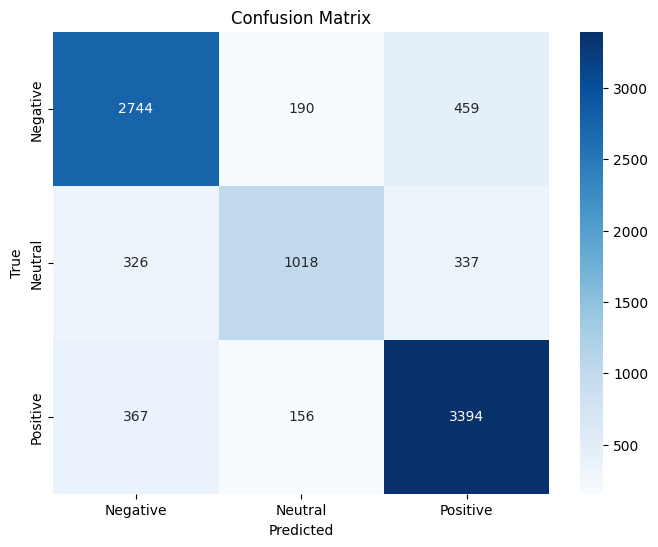

AttributeError: 'Model' object has no attribute 'small_report'

In [45]:
# Generate and print a classification report with the reduced class labels
# info about y_pred_reduced
print("Unique classes in y_pred_reduced:", np.unique(y_pred_reduced))
# size 
print("Size of y_pred_reduced:", y_pred_reduced.size)
# info about y_reduced
print("Unique classes in y_reduced:", np.unique(y_reduced))
# size
print("Size of y_reduced:", y_reduced.size)
#X_reduced
print("Size of X_reduced:", X_reduced.size)
# y_test
print("Size of y_test:", y_test.size)
# y_test_reduced
print("Size of y_test_reduced:", y_test_reduced.size)
# y vector length:
print("y vector length:", y_test_reduced.size)

def plot_confusion_matrix(y_true, y_pred, class_labels):
    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Create a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    
    # Add labels and title
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    
    # Display the plot
    plt.show()

plot_confusion_matrix(y_test_reduced, y_pred_reduced, ["Negative", "Neutral", "Positive"])

#model.small_report(y_test_reduced, y_pred_reduced, ["Negative", "Neutral", "Positive"])
#ValueError: The length of the y vector must match the length of the first dimension of the img matrix.

 

* With only 3 casses the result seems generally better. Neutral is rarely predicted, it's could be because of the class distribution, by joinung the none neutral classes, 'neutrel" now represent anly a small amount of the dataset. The model seems to prfer predicting positive and negative.

## ***Now it's your turn !***

### To achieve the ***"good"*** grade, test at least **two** more models of your choice and answer:
* Comment on the results you obtain, are they similar to the previous ones ? Why ?
    * Lets just focus one the models with for the test done bellow, All three models (RandomForest, LinearSVC, and XGBClassifier) have an accuracy ranging from approximately 0.47 to 0.57.
    * The F1-scores for different sentiment classes vary, but all models have  lower F1-scores for the "Extremely Negative" and "Extremely Positive".
    * Lets talk about the encoding:
      * The choice of encoding method (TF-IDF vs. CountVectorizer) has a noticeable impact on model performance.
      * In some cases, CountVectorizer encoding leads to improved F1-scores, However, the overall effect on model performance varies across different models. For example, XGBClassifier benefits from CountVectorizer encoding, while LinearSVC performs similarly.
* Do you think the poor results are a byproduct of the model we choose or the quality of the data ?
    * It's probably a mix of the two, the data is good itself but not well ballenced (especially for the "Extremely Negative" and "Extremely Positive") and after viewing the labelisation I do not agree with some of them. We can also see that the model have hard time to predict some class and the choice of the model will certainly depend of the purpose of the model. 
* If you had to improve those results, what would you do ?
    * I would try to improve the data, by ballencing the classes, and maybe by changing the labelisation (if i had years in front of me). I would also try to improve the model by changing the hyperparameters, and maybe by trying other models or deep learning models.

### To achieve the ***"advanced"*** grade, try to improve or explain the results we obtained by experimenting with different techniques:
* For example, you could try some of those:
  * Balancing classes (oversampling or subsampling)
  * Applying class weights
  * Monitoring training curves
    * Implementing early stopping (models like XGBoost make it easier)
  * Applying normalization
  * Hyperparameter tuning
  * Or anything else you deem coherent

In [38]:
# Lets try RandomForestClassifier with the two encoders
rd_model = Model(X, y, RandomForestClassifier(), TfidfVectorizer())
rd_model.fit()
y_pred = rd_model.predict()
model.report(y_test, y_pred, class_labels)


                    precision    recall  f1-score   support

Extremely Negative       0.68      0.26      0.38      1189
Extremely Positive       0.70      0.28      0.40      1457
          Negative       0.43      0.46      0.44      2204
           Neutral       0.53      0.65      0.58      1681
          Positive       0.41      0.59      0.48      2460

          accuracy                           0.47      8991
         macro avg       0.55      0.45      0.46      8991
      weighted avg       0.52      0.47      0.46      8991



In [39]:
#lets try LinearSVC 
svc_model = Model(X, y, LinearSVC(), TfidfVectorizer())
svc_model.fit()
y_pred = svc_model.predict()
model.report(y_test, y_pred, class_labels)
 
 

/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning:

The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.



                    precision    recall  f1-score   support

Extremely Negative       0.59      0.64      0.61      1189
Extremely Positive       0.64      0.66      0.65      1457
          Negative       0.52      0.46      0.49      2204
           Neutral       0.64      0.66      0.65      1681
          Positive       0.52      0.52      0.52      2460

          accuracy                           0.57      8991
         macro avg       0.58      0.59      0.58      8991
      weighted avg       0.57      0.57      0.57      8991



In [40]:
# lets try XGBClassifier with the two encoders
xgb_model = Model(X, y, XGBClassifier(), TfidfVectorizer())
xgb_model.fit()
y_pred = xgb_model.predict()
model.report(y_test, y_pred, class_labels)
 

/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/xgboost/data.py:520: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



                    precision    recall  f1-score   support

Extremely Negative       0.63      0.48      0.54      1189
Extremely Positive       0.70      0.51      0.59      1457
          Negative       0.52      0.48      0.50      2204
           Neutral       0.56      0.75      0.64      1681
          Positive       0.49      0.55      0.52      2460

          accuracy                           0.55      8991
         macro avg       0.58      0.55      0.56      8991
      weighted avg       0.56      0.55      0.55      8991



In [41]:
# now with CountVectorizer 
# lets try RandomForestClassifier with the two encoders
rd_model = Model(X, y, RandomForestClassifier(), CountVectorizer())
rd_model.fit()
y_pred = rd_model.predict()
model.report(y_test, y_pred, class_labels)
 
 

                    precision    recall  f1-score   support

Extremely Negative       0.71      0.30      0.42      1189
Extremely Positive       0.75      0.27      0.40      1457
          Negative       0.46      0.49      0.47      2204
           Neutral       0.56      0.68      0.61      1681
          Positive       0.43      0.62      0.51      2460

          accuracy                           0.50      8991
         macro avg       0.58      0.47      0.48      8991
      weighted avg       0.55      0.50      0.49      8991



-> very bad to predicte negative, with as seen before a lot of false negative in extremely positive.

In [46]:
# lets try LinearSVC
svc_model = Model(X, y, LinearSVC(), CountVectorizer())
svc_model.fit()
y_pred = svc_model.predict()
model.report(y_test, y_pred, class_labels)
 

/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/sklearn/svm/_classes.py:32: FutureWarning:

The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.

/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1242: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



                    precision    recall  f1-score   support

Extremely Negative       0.61      0.60      0.61      1189
Extremely Positive       0.66      0.64      0.65      1457
          Negative       0.48      0.44      0.46      2204
           Neutral       0.58      0.70      0.63      1681
          Positive       0.50      0.49      0.49      2460

          accuracy                           0.55      8991
         macro avg       0.57      0.57      0.57      8991
      weighted avg       0.55      0.55      0.55      8991



In [47]:
# lets try XGBClassifier 
xgb_model = Model(X, y, XGBClassifier(), CountVectorizer())
xgb_model.fit()
y_pred = xgb_model.predict()
model.report(y_test, y_pred, class_labels)
 

/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/xgboost/data.py:520: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



                    precision    recall  f1-score   support

Extremely Negative       0.63      0.51      0.56      1189
Extremely Positive       0.73      0.55      0.63      1457
          Negative       0.54      0.48      0.51      2204
           Neutral       0.57      0.78      0.66      1681
          Positive       0.53      0.58      0.55      2460

          accuracy                           0.58      8991
         macro avg       0.60      0.58      0.58      8991
      weighted avg       0.59      0.58      0.58      8991



# Bonus

In [61]:
# Lets try Balancing classes
# Balancing class with the shortes class in length (number of rows)
shortest_class = df_reduced_labels.Sentiment_enc.value_counts().idxmin()
print(shortest_class)
min = df_reduced_labels.Sentiment_enc.value_counts().min()
print(min)
"""{0: 'Extremely Negative',
 1: 'Extremely Positive',
 2: 'Negative',
 3: 'Neutral',
 4: 'Positive'}"""

# balancing the classes with limititing lentgth of each class by length of shortest_class
balanced_df = df.copy()
print(min)
balanced_df = balanced_df.groupby('Sentiment_enc').head(6073)
balanced_df.head()
balanced_df.Sentiment_enc.value_counts()
print(balanced_df.Sentiment_enc.value_counts())
"""3    7713
2    7713
4    7713
1    7713
0    7713
Name: Sentiment_enc, dtype: int64"""

# lets try xgb_model with balanced_df
X_balanced = balanced_df['OriginalTweet']
y_balanced = balanced_df['Sentiment_enc']
 
xgb_model = Model(X_balanced, y_balanced, XGBClassifier(), TfidfVectorizer())
xgb_model.fit()
y_pred = xgb_model.predict()
model.report(y_test, y_pred, class_labels)
 


3
8332
8332
Sentiment_enc
3    6073
4    6073
0    6073
2    6073
1    6073
Name: count, dtype: int64


/Users/thibaultgillard/opt/anaconda3/envs/nlp/lib/python3.10/site-packages/xgboost/data.py:520: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



ValueError: Found input variables with inconsistent numbers of samples: [8991, 6073]